<a href="https://colab.research.google.com/github/Ratnasari124/PCVK_RATNASARI_2024/blob/main/week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**MODUL 11**

MetodeDeteksiObjek: TemplateMatching,Edge
Detection,CornerDetection,GridDetection,ContourDetection

---
Nama : Ratnasari

Kelas : TI 3D

NIM : 2241720007

Absen : 25  


---
Link Jobsheet : https://drive.google.com/file/d/1kmy_cvBH4SBYy3hHdTL5W0Ywv8Q4uVmp/view

Link Github : https://github.com/Ratnasari124/PCVK_RATNASARI_2024/blob/main/week11.ipynb

# LATIHAN PRAKTIKUM

---



## no 1

---



In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## no 2

---

implementasi 6 metode tamplate matching pada opencv




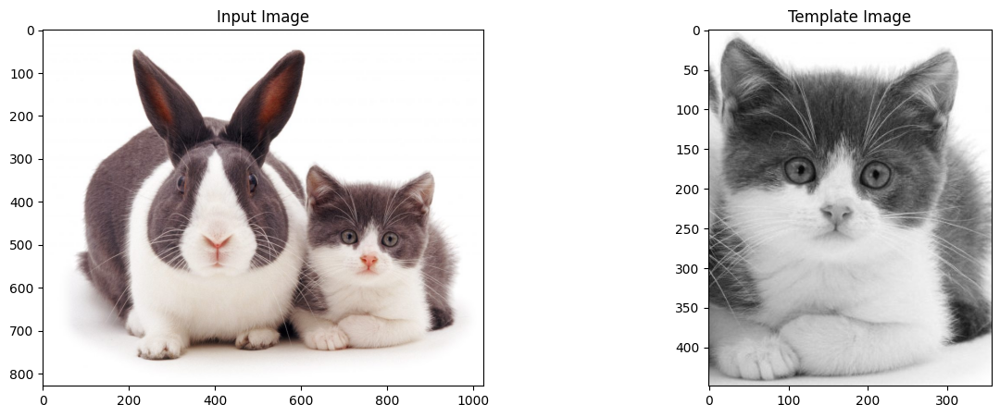

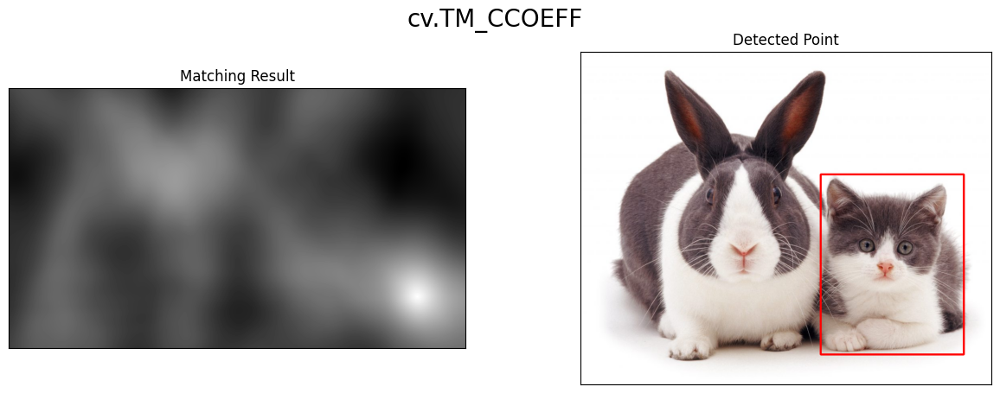

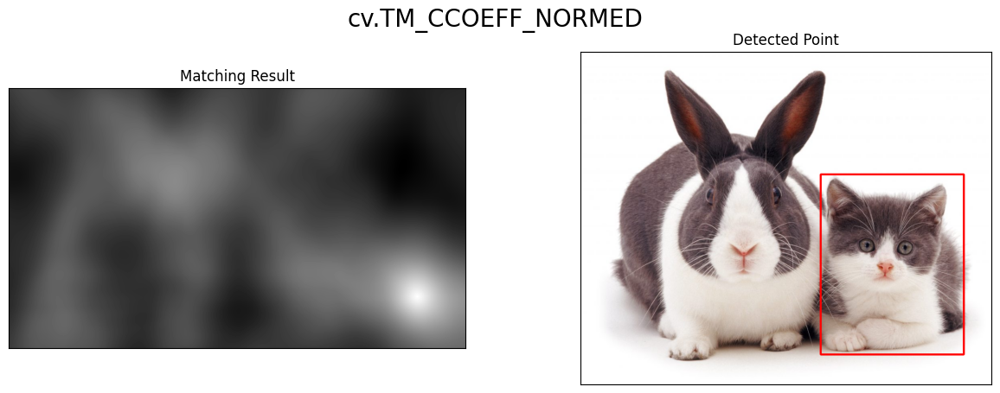

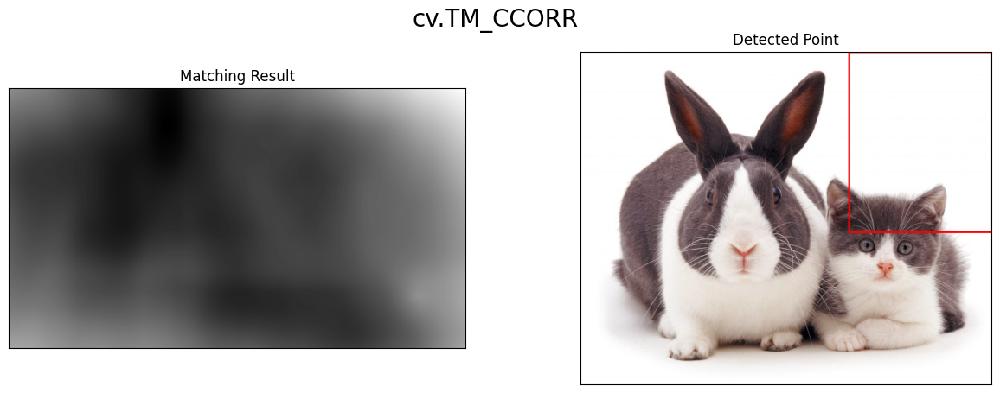

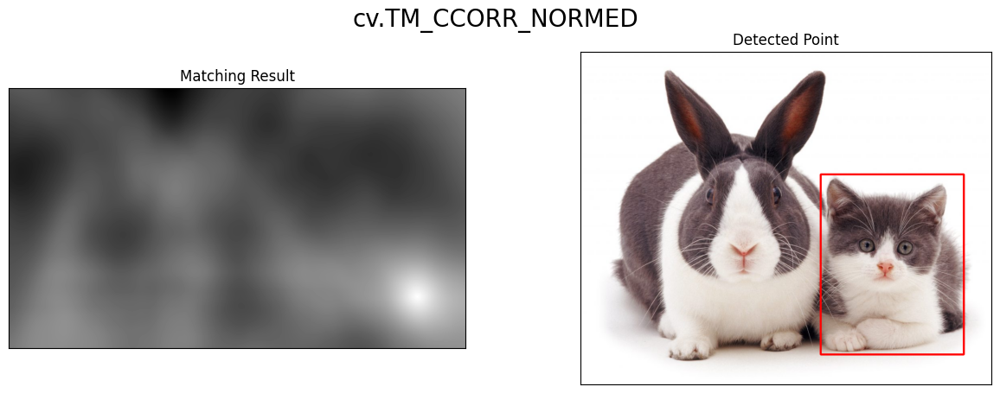

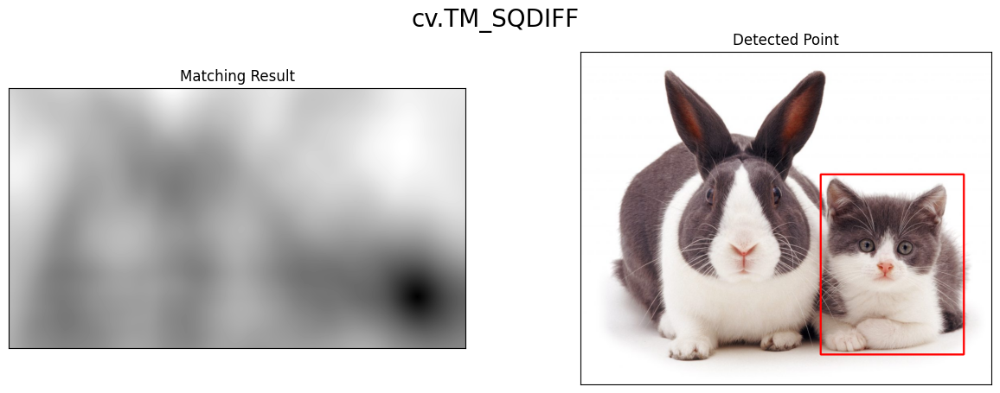

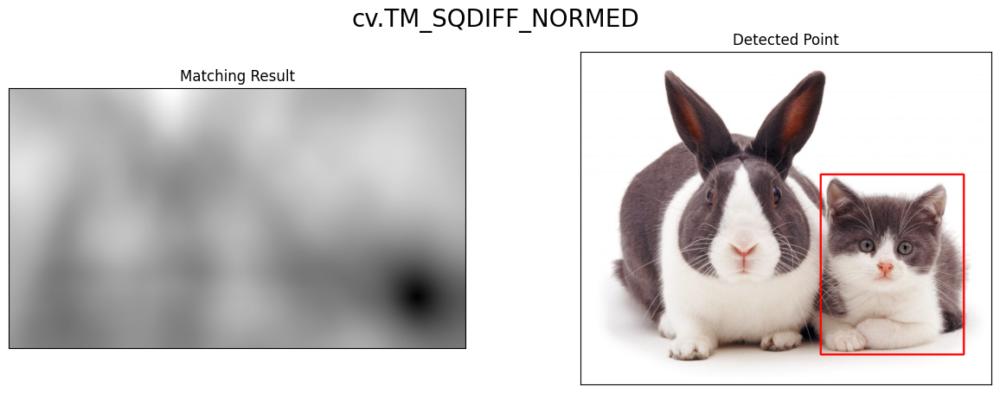

In [ ]:
img = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img2 = img.copy()
template = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/cat2_templatejpg.jpg', 0)
w, h = template.shape[::-1]

f, axarr = plt. subplots(1,2,figsize=(15,5)) # membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# 6 methods
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # Jika methodnya TM_SQDIFF or TM_SQDIFF_NORMED, take minimum karena menggunakan perhitungan matematika berbeda(menggunakan euclidean distance)
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img, top_left, bottom_right,(0,0,255),3)
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()


## no 3

---



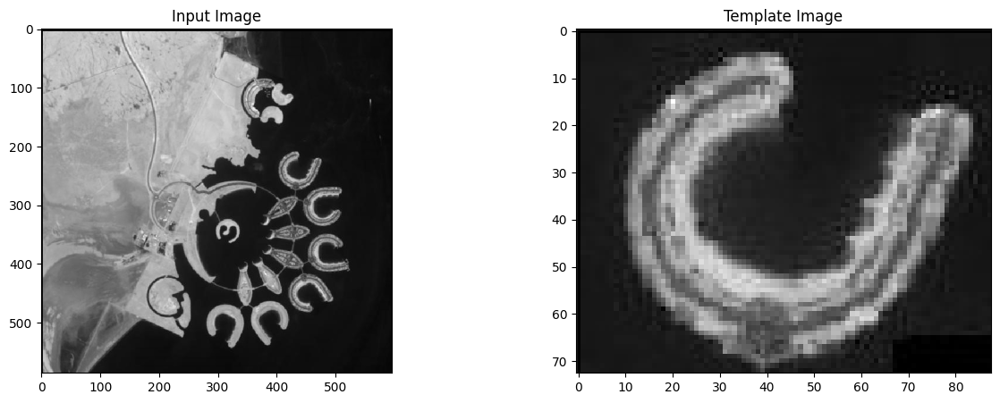

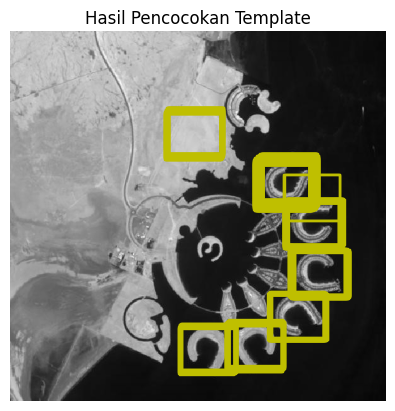

In [ ]:
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.io import imread
import matplotlib.patches as patches
from skimage.feature import match_template


# Load the input image and template in grayscale
match_img = rgb2gray(imread('/content/drive/MyDrive/ratna/Images/Object Detection/bahrain.jpg'))
template = rgb2gray(imread('/content/drive/MyDrive/ratna/Images/Object Detection/bahrain-template.jpg'))

# Create subplots to display the input image and template
fig, axarr = plt.subplots(1, 2, figsize=(15, 5))

# Display the input image
axarr[0].imshow(match_img, cmap='gray')
axarr[0].set_title("Input Image")

# Adding a neutral border (black or gray) to the input image
rect = patches.Rectangle((0, 0), match_img.shape[1], match_img.shape[0], linewidth=2, edgecolor='black', facecolor='none')
axarr[0].add_patch(rect)

# Display the template image
axarr[1].imshow(template, cmap='gray')
axarr[1].set_title("Template Image")

# Adding a neutral border to the template image
rect = patches.Rectangle((0, 0), template.shape[1], template.shape[0], linewidth=2, edgecolor='black', facecolor='none')
axarr[1].add_patch(rect)

# Show the plot
plt.show()

# Hitung kemiripan citra dengan citra template
result = match_template(match_img, template)

# Tentukan threshold untuk menentukan hasil match
threshold = 0.4
locations = np.where(result >= threshold)

# Plot hasil match
fig, ax = plt.subplots()
ax.imshow(match_img, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='y', facecolor='none', linewidth=1)
    ax.add_patch(rect)
plt.title("Hasil Pencocokan Template")
plt.show()

## no 4

---
implementasi metode sobel edge detection, canny edge detection dan laplacian edge detection


**a. Sobel Edge Detection**

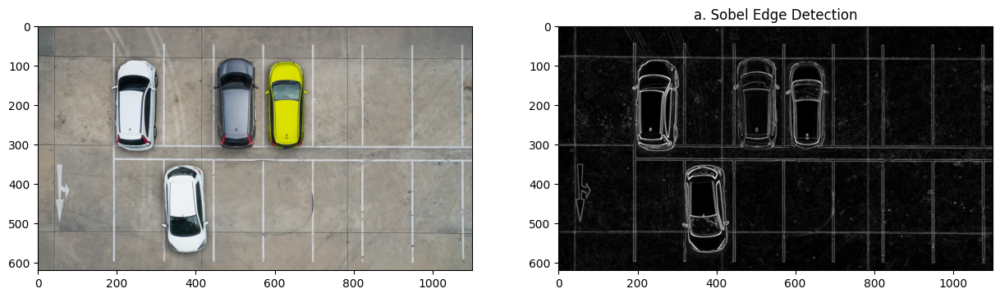

In [ ]:
sobel_car = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(sobel_car, cv.COLOR_BGR2GRAY)

# remove noise
img_n = cv.GaussianBlur(gray,(3,3),0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img_n, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img_n, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt. subplots(1,2,figsize=(15,5))
plt.subplot(121),plt.imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
plt.subplot(122),plt.imshow(img_sobelxy, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

**b. Canny Edge Detection**

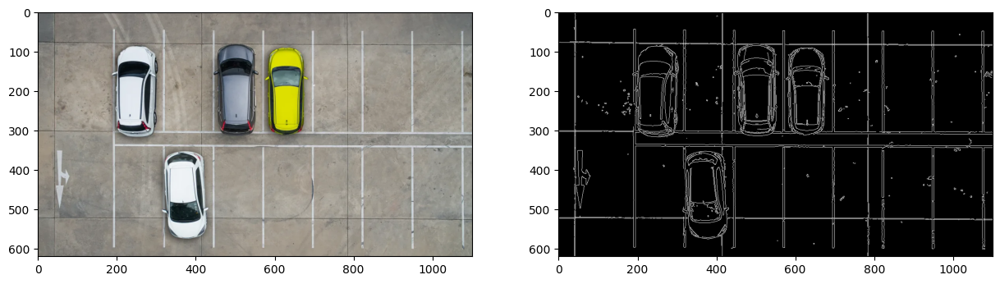

In [ ]:
canny_edge = cv.Canny(sobel_car, 100, 200)

f, axarr = plt.subplots(1,2,figsize=(15,5))
plt.subplot(121), plt.imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(canny_edge, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(canny_edge, cv.COLOR_BGR2RGB))

**c. Laplacian Edge Detection**

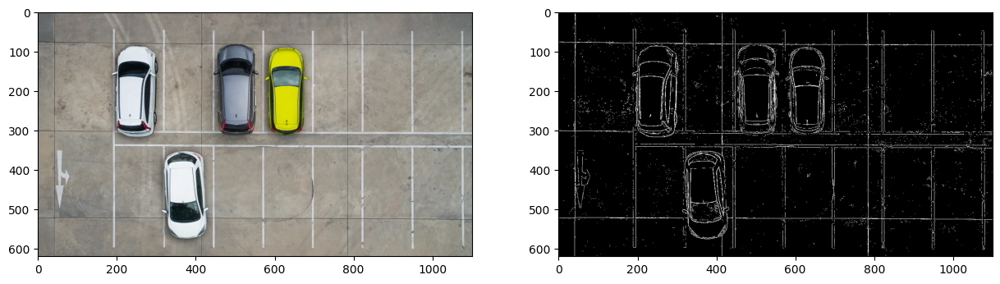

In [ ]:

laplacian_car = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/car-park.jpg', cv.IMREAD_COLOR)
# remove noise
image_gray = cv.cvtColor(laplacian_car, cv.COLOR_BGR2GRAY)
# apply laplacian
laplacian = cv.Laplacian(gray, cv.CV_64F)
_, binary = cv.threshold(laplacian, 30, 255, cv.THRESH_BINARY)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(laplacian_car, cv.COLOR_BGR2RGB))
axarr[1].imshow(binary, cmap='gray')
plt.show()

## no 5

---
Corner Detection

**a. Harris Corner Detection**

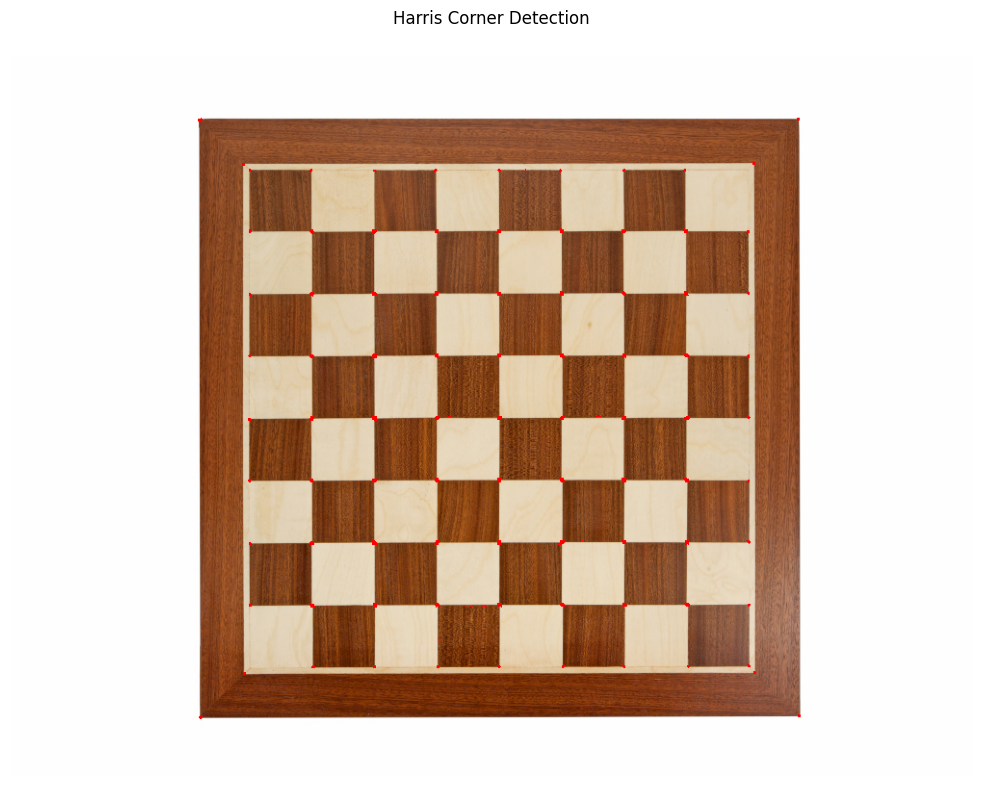

In [39]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

# Memuat gambar
filename = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/chess-board.jpg')

# Mengubah gambar menjadi grayscale
gray_img = cv.cvtColor(filename, cv.COLOR_BGR2GRAY)

# Menerapkan Harris Corner Detection
dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

# Konversi ke tipe float32 untuk deteksi sudut
gray_img = np.float32(gray_img)

# Penerapan Harris Corner Detection sekali lagi
harris_output = cv.cornerHarris(gray_img, 2, 3, 3)

# Melakukan dilasi pada hasil deteksi sudut
harris_output = cv.dilate(harris_output, None)

# Menandai sudut dengan warna merah
filename[dst > 0.01 * dst.max()] = [0, 0, 255]

# Menampilkan gambar tanpa penggaris
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(filename, cv.COLOR_BGR2RGB))
plt.axis('off')  # Menghilangkan penggaris di pinggir
plt.title('Harris Corner Detection')
plt.show()


**b. Shi-Tomasi Detection**

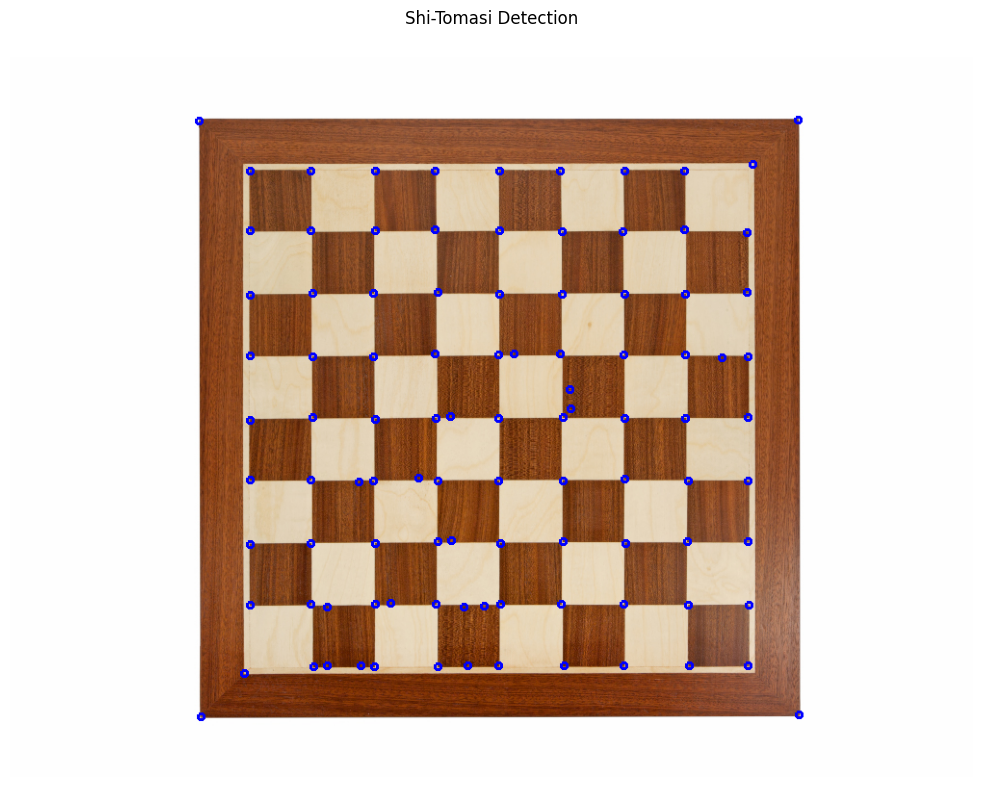

In [50]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

# Load gambar
img_path = '/content/drive/MyDrive/ratna/Images/Object Detection/chess-board.jpg'
img = cv.imread(img_path)

# Convert ke grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# mendeteksi corner menggunakan Shi-Tomasi method
corners = cv.goodFeaturesToTrack(gray, maxCorners=100, qualityLevel=0.01, minDistance=10)
corners = np.intp(corners)  # Mengganti np.int0 dengan np.intp

# membuat lingkaran biru untuk setiap titik
for i in corners:
    x, y = i.ravel()
    cv.circle(img, (x, y), 3, (255, 0, 0), 2)  # Warna biru, radius lebih besar

# Menampilkan gambar tanpa penggaris
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Detection')
plt.axis('off')
plt.show()


## no 6

---
Grid detection menggunakan Hough Transform


number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


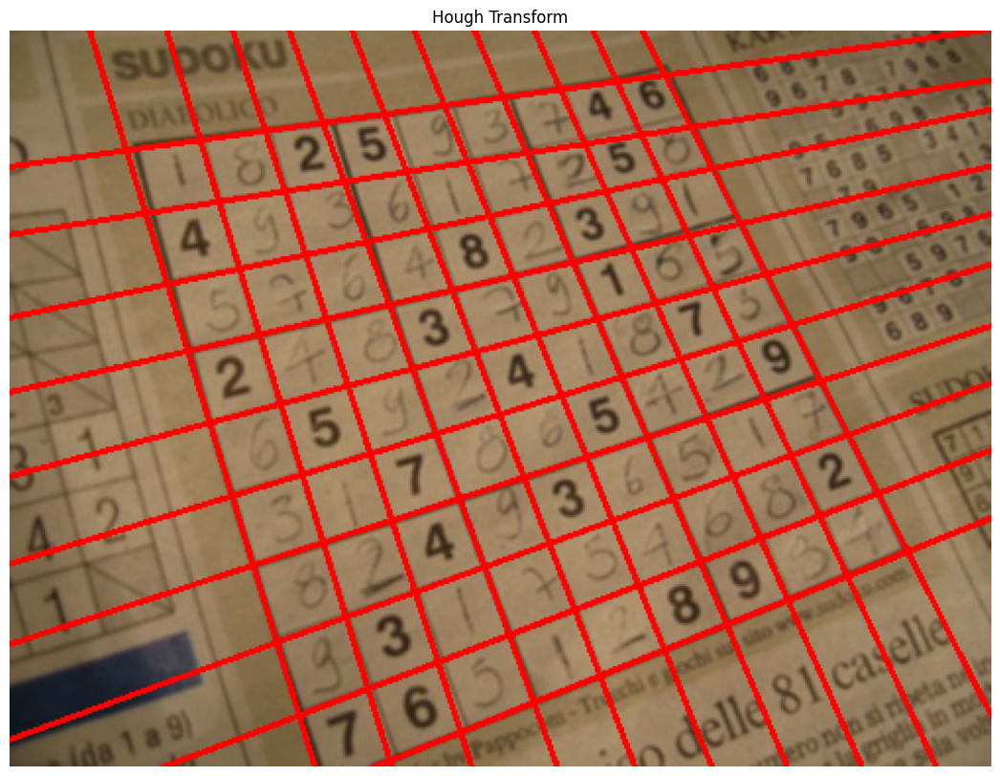

In [53]:
import cv2
import numpy as np

img_hough = cv2.imread('/content/drive/MyDrive/ratna/Images/Object Detection/sudoku.jpg')
img_gs = cv.cvtColor(img_hough, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gs, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges, kernel, iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges, 1, np.pi / 180, 150)


if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)


    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(img_hough, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(img_hough, cv.COLOR_BGR2RGB))
    plt.title('Hough Transform')
    plt.axis('off')
    plt.show()

## no 7

---

fungsi findContours() pada Contour Detection

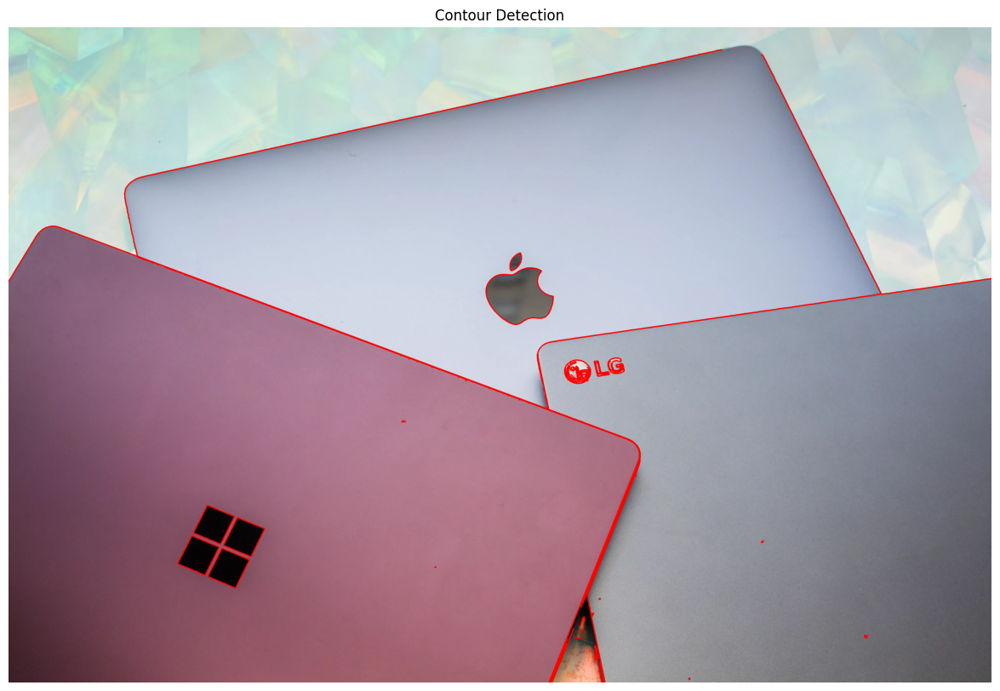

In [62]:
import numpy as np
import cv2 as cv

img = cv.imread('/content/drive/MyDrive/ratna/Images/Object Detection/laptop.jpg')
assert img is not None, "file could not be read, check with os.path.exists()"
imgray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edged = cv.Canny(imgray, 30, 200, 0)
contours, hierarchy = cv.findContours(edged, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Contour Detection')
plt.axis('off')
plt.show()

# PENGAYAAN MATERI KTP

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban

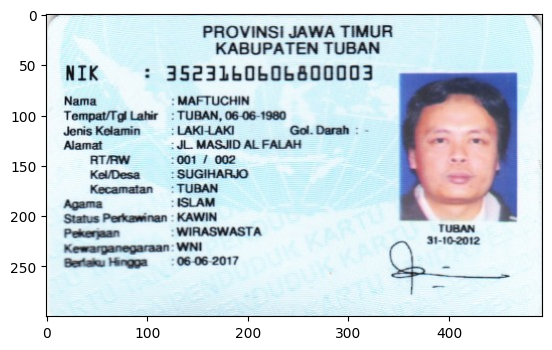

In [68]:
img_pktp = cv2.imread('/content/drive/MyDrive/ratna/Images/KTP_More/KTP_More/ktp3.png')
img_pktp = cv.cvtColor(img_pktp, cv.COLOR_BGR2RGB)
plt.imshow(img_pktp)

2. Muat 2 library berikut sebagai tahapan persiapan

In [69]:
import cv2
import os

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori
dataset tersebut

In [89]:
# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/ratna/ktp"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
    if name_file.endswith((".jpg", ".png", ".jpeg")):  # Pastikan hanya file gambar yang diproses
        file_path = os.path.join(path_plate, name_file)
        src = cv2.imread(file_path)

        if src is not None:  # Memeriksa apakah gambar telah dibaca dengan benar
            # Lakukan pemrosesan gambar di sini
            blurred = cv2.GaussianBlur(src, (5, 5), 0)
            gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

            # Sekarang Anda dapat melanjutkan pemrosesan gambar sesuai kebutuhan Anda
        else:
            print(f"Gagal membaca file {name_file}")

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle
dapat direduksi

In [90]:
# Filtering
for i in range(10):
  blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan
binerisasi citra (thresholding)

In [91]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY
+ cv2.THRESH_OTSU)
print(ret, bw.shape)

168.0 (300, 493)


6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter
atau obyek tidak berhimpitan.

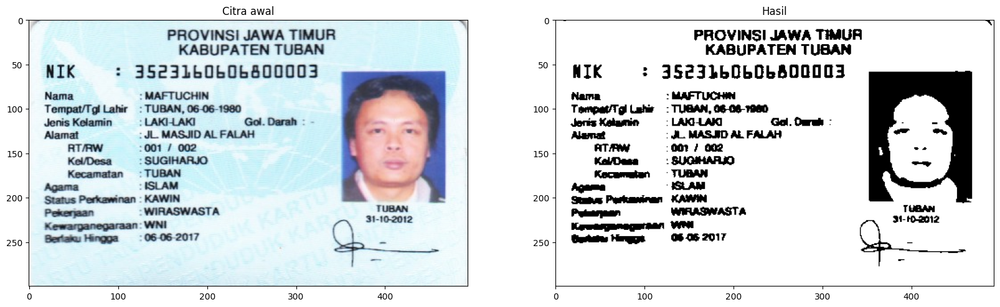

In [96]:
# Tampilkan gambar asli dan hasil deteksi tepi
f, axarr = plt.subplots(1, 2, figsize=(20, 10))
# Menampilkan citra awal (gambar asli)
axarr[0].imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
axarr[0].set_title('Citra awal')

# Menampilkan hasil deteksi tepi (gambar hitam putih)
axarr[1].imshow(bw, cmap='gray')
axarr[1].set_title('Hasil')

plt.show()


7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

---



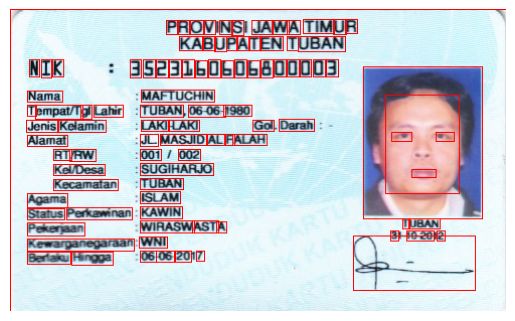

In [100]:
ktp = cv.imread("/content/drive/MyDrive/ratna/ktp/ktp3.png")

blurred = cv.GaussianBlur(ktp, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 8 and w >= 8 and float(ras) <= 10:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 7 and float(ras) <= 8:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

      # cv.drawContours(ktp, contours, -1, (0, 255, 0), 2)

# Menampilkan gambar KTP dengan kontur menggunakan plt
ktp_rgb = cv.cvtColor(ktp, cv.COLOR_BGR2RGB)
plt.imshow(ktp_rgb)
plt.axis('off')
plt.show()

# TUGAS PRAKTIKUM

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP
untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing
yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan
secara berkelompok dengan aturan sebagai berikut:
Kelompok 1 – KTP Riyanto Sleman
Kelompok 2 – KTP Galang Raka Bengkulu
Kelompok 3 – KTP Arief Wijaya Cimahi
Kelompok 4 – KTP Edo Nias
Kelompok 5 – KTP Widiarso Bekasi
Kelompok 6 – KTP Abdurrauf Soppeng


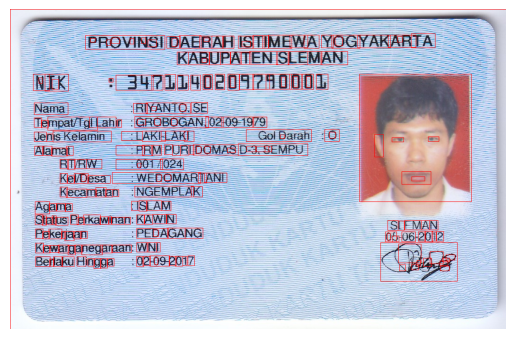

In [103]:
ktp = cv.imread("/content/drive/MyDrive/ratna/ktp/ktp.png")

blurred = cv.GaussianBlur(ktp, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 8 and w >= 8 and float(ras) <= 10:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 7 and float(ras) <= 8:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

      # cv.drawContours(ktp, contours, -1, (0, 255, 0), 2)

# Menampilkan gambar KTP dengan kontur menggunakan plt
ktp_rgb = cv.cvtColor(ktp, cv.COLOR_BGR2RGB)
plt.imshow(ktp_rgb)
plt.axis('off')
plt.show()